In [1]:
import numpy as np
import scipy as sp
import torch as th

import os, pdb, sys, json, glob, tqdm
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

# sns.set_style('whitegrid')

# sns.set_context('notebook')

# %matplotlib notebook
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 200
sns.set(context='poster',
        style='ticks',
        font_scale=1,
        rc={'axes.grid':True,
            'grid.color':'.9',
            'grid.linewidth':0.75})
%load_ext autoreload
%autoreload 2

dev = 'cuda'
root = '/home/ubuntu/ext_vol'
import sys
sys.path.insert(0, f'{root}/inpca')

from utils import get_data, get_idx

In [2]:
import plotly.graph_objects as go
import numpy as np
import plotly.offline as pyo
import pandas as pd
pyo.init_notebook_mode()

## Plotly

In [10]:
def plotly_3d(dc, r, emph=[], empcolor='darkred', empsize=10, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'bn', 'lr', 'wd', 'corner'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-1, 1]):

    for (config, idxs) in dc.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
        tmax = dc.iloc[idxs]['t'].max()
        dc.loc[idxs, 't'] /= tmax
    for i in range(ne):
        dc[f"x{i+1}"] = r['xp'][:, i]
    d_ = dc
        
    for col in cols:
        dc[col] = f'{col}: ' + dc[col].astype(str)
    text = dc[cols].apply("<br>".join, axis=1)
    text = 't: ' + dc['t'].astype(str) + '<br>' + text
    
    c = dc[color]
    if cmap is not None:
        c = c.map(cmap)

    size = 2 * np.ones(len(dc))

    if separate_traj:
        fig = go.Figure()
        for (i, (conds, ii)) in enumerate(list(d_.groupby(groups).indices.items())):
            dc_ = dc.iloc[ii].reset_index()
            fig.add_trace(
                go.Scatter3d(
                x=dc_[f'x{dims[0]}'],  
                y=dc_[f'x{dims[1]}'],  
                z=dc_[f'x{dims[2]}'],  
                hovertemplate='<b>%{text}</b><extra></extra>',
                text=text[ii],
                marker=dict(
                    size=2,
                    opacity=0.8,
                    color=c[ii],
                    symbolsrc='m',
                    colorscale='s',
                ),
                mode=mode,
                line=dict(
                    color=c[ii],
                    width=2,
                ),
                name=conds[-1]
            ),
                
            )
    else:
        
        fig = go.Figure(data=[
            go.Scatter3d(
                x=dc[f'x{dims[0]}'],  
                y=dc[f'x{dims[1]}'],  
                z=dc[f'x{dims[2]}'],  
                hovertemplate='<b>%{text}</b><extra></extra>',
                text=text,
                marker=dict(
                    size=2,
                    opacity=0.8,
                    color=c,
                    symbolsrc='m',
                    colorscale=colorscale,
                ),
                mode='markers',
            )
        ])
        if len(emph) > 0:
            for ie in emph:
                demph = dc.iloc[ie]
                fig.add_trace(
                go.Scatter3d(
                    x=demph[f'x{dims[0]}'],  
                    y=demph[f'x{dims[1]}'],  
                    z=demph[f'x{dims[2]}'],  

                    marker=dict(
                        size=empsize,
                        opacity=0.8,
                        color=empcolor,
                    ),
                    mode=empmode,
                    )
                )
    fig.update_layout(
        autosize=False,
        width=1000,
        height=1000,
        scene_xaxis_range=axis_range,
    scene_yaxis_range=axis_range,
    scene_zaxis_range=axis_range,
    scene_aspectmode='cube')

    print(r['e'])

    results = [fig]
    if return_text: 
        results.append(text)
    if return_d:
        results.append(d_)
    return results

def plotly_2d(dc, text, ne=3):
    fig = go.Figure(data=go.Splom(
                dimensions=[dict(label=f'x{i}',
                                 values=dc[f'x{i}']) for i in range(1, ne+1)],
                showupperhalf=False, # remove plots on diagonal
                diagonal_visible=False,
                text=text,
                marker=dict(color=dc.t,
                            showscale=False, # colors encode categorical variables
                            line_color='white', size=2, opacity=0.8)
                ), )


    fig.update_layout(
        autosize=False,
        width=1000,
        height=1000
    )

    fig.show()

In [11]:
def triplot(dc, r, d=3, emph=[], cmap='vlag', cdict=None, ckey='', skey='', sdict={},
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, avggroupby=['opt'], plot_lines=False,
            xrange=[-1, 1], yrange=[-1, 1]
            ):
    figs, axs = plt.subplots(d-1, d-1, figsize=(12, 12),
                            sharex=True, sharey=True)
    ee = r['e']
    c = dc[ckey]
    if skey:
        s = dc[skey]
    else:
        s = 2
        
    if cdict:
        c = c.fillna('nan')
        c = c.map(cdict)
        print(cdict)  
   

    for (i1, d1) in enumerate(range(d-1)):
        for (i2, d2) in enumerate(range(d1+1, d)):
            if d2 > d1 + 1:
                axs[d1, d2-1].set_visible(False)
            ax = axs[d2-1, d1]
            ax.axis("square")

            xx = r['xp']
            sc = ax.scatter(xx[:, d1], xx[:, d2],
                            c=c, cmap=cmap, vmin=c.min(), vmax=c.max(), s=s, lw=0.5, alpha=0.5)
            if len(emph) > 0:
                sc_emph = ax.scatter(xx[emph, d1], xx[emph, d2],
                            c='red', s=s+10, lw=0.5, alpha=0.5)
            ax.set_xlim(xrange)
            ax.set_ylim(yrange)
            if plot_lines:
                config_cols = ['seed', 'm', 'opt', 'bs', 'aug', 'bn', 'lr', 'wd']
                config_cols.remove(key)
                dc_ = dc.iloc[ii]
                for (c, ii_) in dc_.groupby(config_cols).indices.items():
                    xx_ = xx[ii_]
                    print(dc_.iloc[ii_]['t'])
                    _ = sns.lineplot(x=xx_[:, d1], y=xx_[:, d2], ax=ax, legend=False, lw=0.2)

                #                 sc = ax.plot(xx[:, d1], xx[:, d2], label=k, lw=0.5)
            if ee[d1] < 0:
                ax.spines['bottom'].set_color('red')
            if ee[d2] < 0:
                ax.spines['left'].set_color('red')
            ax.set_xlabel(f'pc{d1+1}')
            ax.set_ylabel(f'pc{d2+1}')
            if plot_avg:
                iavg = get_idx(dc, f't >= 0 & seed == -1')
                for (k, v) in dc.iloc[iavg].groupby(avggroupby).indices.items():
                    avg_ms = r['xp'][v]
                    avg = sns.lineplot(x=avg_ms[:, d1], y=avg_ms[:, d2],
                                       label=k, ax=ax, legend=False, lw=1.0)
    handles, labels = ax.get_legend_handles_labels()
    if evals:
        ax = figs.add_subplot(d-1, d-1, 2)
        ax.set_yscale('log')
        ax.grid()
        w = 0.5
        for e in ee:
            ax.plot((-w/4, w/4), (np.abs(e), np.abs(e)),
                    c='k' if e > 0 else 'r')
        ax.set_xlim([-w/2, w/2])
        ax.get_xaxis().set_visible(False)

    ax = axs[0, -1]
    clb = plt.colorbar(sc, pad=0.2, ax=ax)
    clb.ax.set_title(ckey)
    ax = axs[0, -1]
    ax.legend(handles, labels, loc='lower center')
    plt.show()

In [ ]:
fn = 'yh_all'
loc = f'{root}/inpca/inpca_results_all/simple_aug'
_, dc = th.load(os.path.join(loc,'didx_%s.p'%fn))
r = th.load(os.path.join(loc,'r_%s.p'%fn))
plotly_3d(dc=dc.reset_index(drop=True), r=r, ne=3, return_text=False,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t', cmap=None, mode='markers')

#### Corners

In [ ]:
colors = ["darkred", "blue", "turquoise", "green", "gold", "purple"]

fn = 'yh_all'
loc = f'{root}/inpca/inpca_results_all/corners'
dc = th.load(os.path.join(loc,'didx_%s.p'%fn))['dc']
r = th.load(os.path.join(loc,'r_%s.p'%fn))
fig, text, dc = plotly_3d(dc=dc.reset_index(drop=True), r=r, ne=3, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd', 'corner'],
              color='t', mode='lines', separate_traj=True, axis_range=[-2, 2],
              )
fig.update_layout(title="corners")
fig.show()

{'corner: normal': 0, 'corner: uniform': 1, 'corner: subsample-200': 2, 'corner: subsample-2000': 3}


/tmp/ipykernel_4910/3222325150.py:63: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



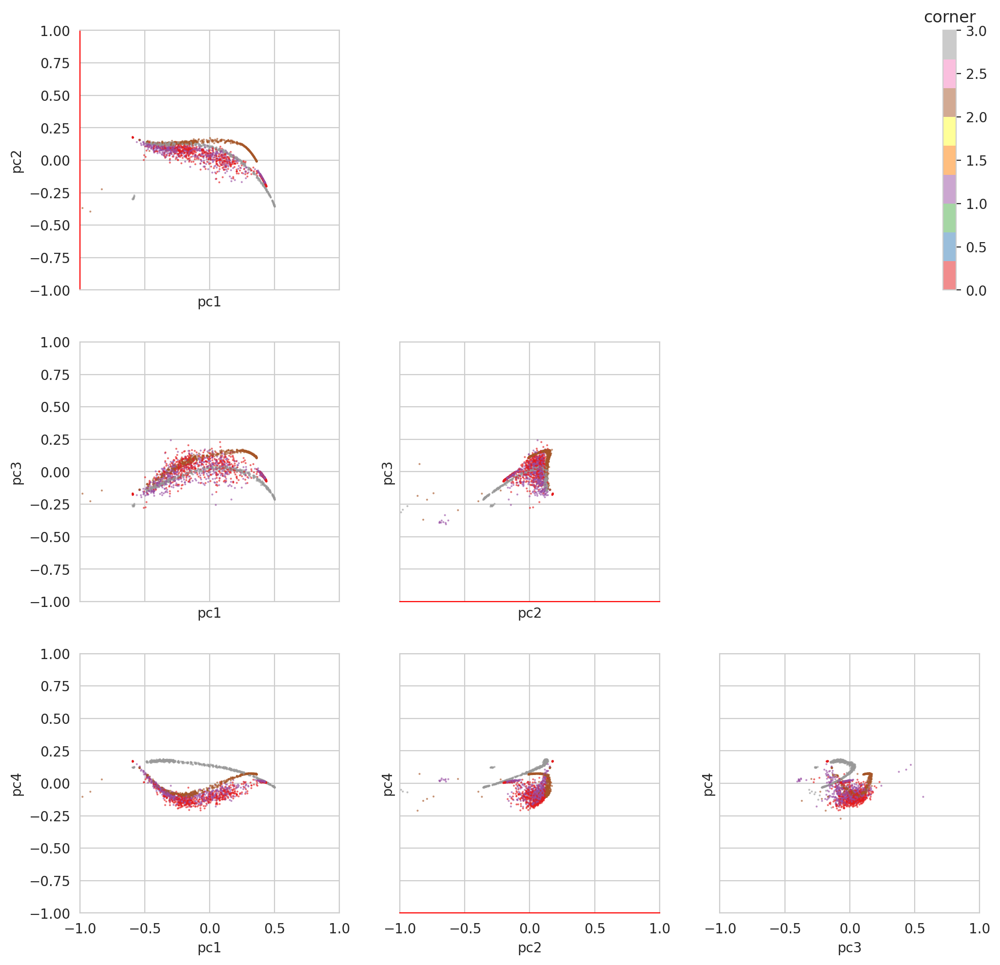

In [131]:
cmap = {f"corner: {c}": i for (i, c) in enumerate(['normal', 'uniform', 'subsample-200', 'subsample-2000'])} 
triplot(dc, r, d=4, key='aug', ckey='corner', cmap='Set1', cdict=cmap, sdict={},
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False
            )

[Text(0.5, 1.0, '1 - err')]

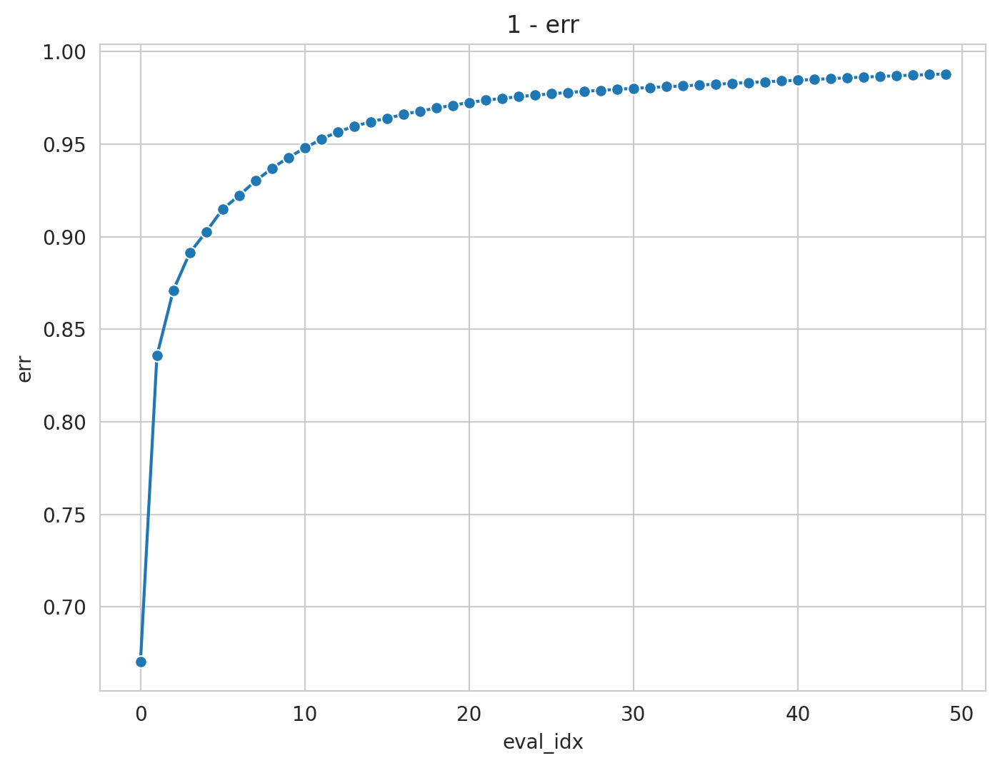

In [132]:
w = r['w']
import scipy.sparse.linalg as sp
ne = 50
es = sp.eigsh(w, ne, which='LM', return_eigenvectors=False)[::-1]
fn=np.linalg.norm(w, ord='fro')
df = pd.DataFrame(dict(eval_idx=np.arange(len(es)), err=1 - np.sqrt(1-np.cumsum(es ** 2)/fn**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='err', marker="o")
g.set(title="1 - err")

### all evals

In [5]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_all.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_yh_all.p").reset_index(drop=True)

In [6]:
import h5py
f = h5py.File(f'/home/ubuntu/ext_vol/inpca/inpca_results_all/w_yh_all.h5', 'r')
w = f['w']

In [10]:
from itertools import combinations_with_replacement
from utils import dinpca
indices = didx.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices
configs = list(indices.keys())
errs = np.zeros([len(configs), len(configs)])
sign = th.Tensor(np.sign(r['e'][:3]))
for i in range(len(configs)):
    for j in range(i, len(configs)):
        print(i, j)
        ii = indices[configs[i]]
        ij = indices[configs[j]]
        dinpca_ij = dinpca(th.Tensor(r['xp'][ii, :3]), 
                           th.Tensor(r['xp'][ij, :3]), 
                           sign, dev='cuda').cpu().numpy().T
        wij = w[ii, :][:, ij]
        errs[i, j] = ((dinpca_ij-wij)**2).sum() / (wij**2).sum()
        errs[j, i] = errs[i, j]

36 36
36 37
36 38
36 39
36 40
36 41
36 42
36 43
36 44
36 45
36 46
36 47
36 48
36 49
36 50
36 51
36 52
36 53
36 54
36 55
36 56
36 57
36 58
36 59
36 60
36 61
36 62
36 63
36 64
36 65
36 66
36 67
36 68
36 69
36 70
36 71
36 72
36 73
36 74
36 75
36 76
36 77
36 78
36 79
36 80
36 81
36 82
36 83
36 84
36 85
36 86
36 87
36 88
36 89
36 90
36 91
36 92
36 93
36 94
36 95
36 96
36 97
36 98
36 99
36 100
36 101
36 102
36 103
36 104
36 105
36 106
36 107
36 108
36 109
36 110
36 111
36 112
36 113
36 114
36 115
36 116
36 117
36 118
36 119
36 120
36 121
36 122
36 123
36 124
36 125
36 126
36 127
36 128
36 129
36 130
36 131
36 132
36 133
36 134
36 135
36 136
36 137
36 138
36 139
36 140
36 141
36 142
36 143
36 144
36 145
36 146
36 147
36 148
36 149
36 150
36 151
36 152
36 153
36 154
36 155
36 156
36 157
36 158
36 159
36 160
36 161
36 162
36 163
36 164
36 165
36 166
36 167
36 168
36 169
36 170
36 171
36 172
36 173
36 174
36 175
36 176
36 177
36 178
36 179
36 180
36 181
36 182
36 183
36 184
36 185
36 186
36 187


42 45
42 46
42 47
42 48
42 49
42 50
42 51
42 52
42 53
42 54
42 55
42 56
42 57
42 58
42 59
42 60
42 61
42 62
42 63
42 64
42 65
42 66
42 67
42 68
42 69
42 70
42 71
42 72
42 73
42 74
42 75
42 76
42 77
42 78
42 79
42 80
42 81
42 82
42 83
42 84
42 85
42 86
42 87
42 88
42 89
42 90
42 91
42 92
42 93
42 94
42 95
42 96
42 97
42 98
42 99
42 100
42 101
42 102
42 103
42 104
42 105
42 106
42 107
42 108
42 109
42 110
42 111
42 112
42 113
42 114
42 115
42 116
42 117
42 118
42 119
42 120
42 121
42 122
42 123
42 124
42 125
42 126
42 127
42 128
42 129
42 130
42 131
42 132
42 133
42 134
42 135
42 136
42 137
42 138
42 139
42 140
42 141
42 142
42 143
42 144
42 145
42 146
42 147
42 148
42 149
42 150
42 151
42 152
42 153
42 154
42 155
42 156
42 157
42 158
42 159
42 160
42 161
42 162
42 163
42 164
42 165
42 166
42 167
42 168
42 169
42 170
42 171
42 172
42 173
42 174
42 175
42 176
42 177
42 178
42 179
42 180
42 181
42 182
42 183
42 184
42 185
42 186
42 187
42 188
42 189
42 190
42 191
42 192
42 193
42 194
42 19

48 90
48 91
48 92
48 93
48 94
48 95
48 96
48 97
48 98
48 99
48 100
48 101
48 102
48 103
48 104
48 105
48 106
48 107
48 108
48 109
48 110
48 111
48 112
48 113
48 114
48 115
48 116
48 117
48 118
48 119
48 120
48 121
48 122
48 123
48 124
48 125
48 126
48 127
48 128
48 129
48 130
48 131
48 132
48 133
48 134
48 135
48 136
48 137
48 138
48 139
48 140
48 141
48 142
48 143
48 144
48 145
48 146
48 147
48 148
48 149
48 150
48 151
48 152
48 153
48 154
48 155
48 156
48 157
48 158
48 159
48 160
48 161
48 162
48 163
48 164
48 165
48 166
48 167
48 168
48 169
48 170
48 171
48 172
48 173
48 174
48 175
48 176
48 177
48 178
48 179
48 180
48 181
48 182
48 183
48 184
48 185
48 186
48 187
48 188
48 189
48 190
48 191
48 192
48 193
48 194
48 195
48 196
48 197
48 198
48 199
48 200
48 201
48 202
48 203
48 204
48 205
48 206
48 207
48 208
48 209
48 210
48 211
48 212
48 213
48 214
48 215
48 216
48 217
48 218
48 219
48 220
48 221
48 222
48 223
48 224
48 225
48 226
48 227
48 228
48 229
48 230
48 231
48 232
48 233
48

54 161
54 162
54 163
54 164
54 165
54 166
54 167
54 168
54 169
54 170
54 171
54 172
54 173
54 174
54 175
54 176
54 177
54 178
54 179
54 180
54 181
54 182
54 183
54 184
54 185
54 186
54 187
54 188
54 189
54 190
54 191
54 192
54 193
54 194
54 195
54 196
54 197
54 198
54 199
54 200
54 201
54 202
54 203
54 204
54 205
54 206
54 207
54 208
54 209
54 210
54 211
54 212
54 213
54 214
54 215
54 216
54 217
54 218
54 219
54 220
54 221
54 222
54 223
54 224
54 225
54 226
54 227
54 228
54 229
54 230
54 231
54 232
54 233
54 234
54 235
54 236
54 237
54 238
54 239
54 240
54 241
55 55
55 56
55 57
55 58
55 59
55 60
55 61
55 62
55 63
55 64
55 65
55 66
55 67
55 68
55 69
55 70
55 71
55 72
55 73
55 74
55 75
55 76
55 77
55 78
55 79
55 80
55 81
55 82
55 83
55 84
55 85
55 86
55 87
55 88
55 89
55 90
55 91
55 92
55 93
55 94
55 95
55 96
55 97
55 98
55 99
55 100
55 101
55 102
55 103
55 104
55 105
55 106
55 107
55 108
55 109
55 110
55 111
55 112
55 113
55 114
55 115
55 116
55 117
55 118
55 119
55 120
55 121
55 122
55

61 93
61 94
61 95
61 96
61 97
61 98
61 99
61 100
61 101
61 102
61 103
61 104
61 105
61 106
61 107
61 108
61 109
61 110
61 111
61 112
61 113
61 114
61 115
61 116
61 117
61 118
61 119
61 120
61 121
61 122
61 123
61 124
61 125
61 126
61 127
61 128
61 129
61 130
61 131
61 132


KeyboardInterrupt: 

In [62]:
didx[4200:4500]

,seed,m,opt,t,err,favg,verr,vfavg,bs,aug,bn,lr,wd
4200,42,convmixer,sgd,113,0.38274,1.066164,0.4051,1.132996,1000,none,True,0.50,0.001
4201,42,convmixer,sgd,125,0.40798,1.128366,0.4320,1.219636,1000,none,True,0.50,0.001
4202,42,convmixer,sgd,137,0.38934,1.095560,0.4202,1.189190,1000,none,True,0.50,0.001
4203,42,convmixer,sgd,149,0.33546,0.938799,0.3597,1.037558,1000,none,True,0.50,0.001
4204,42,convmixer,sgd,151,0.40886,1.135034,0.4425,1.250054,1000,none,True,0.50,0.001
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4495,42,convmixer,sgdn,3700,0.01472,0.041279,0.1161,0.553857,500,simple,True,0.25,0.000
4496,42,convmixer,sgdn,4100,0.01116,0.032074,0.1161,0.589265,500,simple,True,0.25,0.000
4497,42,convmixer,sgdn,4500,0.00866,0.025219,0.1077,0.577335,500,simple,True,0.25,0.000
4498,42,convmixer,sgdn,4900,0.00950,0.025697,0.1096,0.600830,500,simple,True,0.25,0.000


In [60]:
n =4200
err = []
for i in range(7):
    dinpca_ij = dinpca(x1=th.Tensor(r['xp'][:n, :i]),
                       sign=th.Tensor(np.sign(r['e'][:i])),
                       dev='cuda').cpu().numpy()
    err.append(((dinpca_ij - w[:n, :n])**2).sum() / (w[:n, :n]**2).sum())

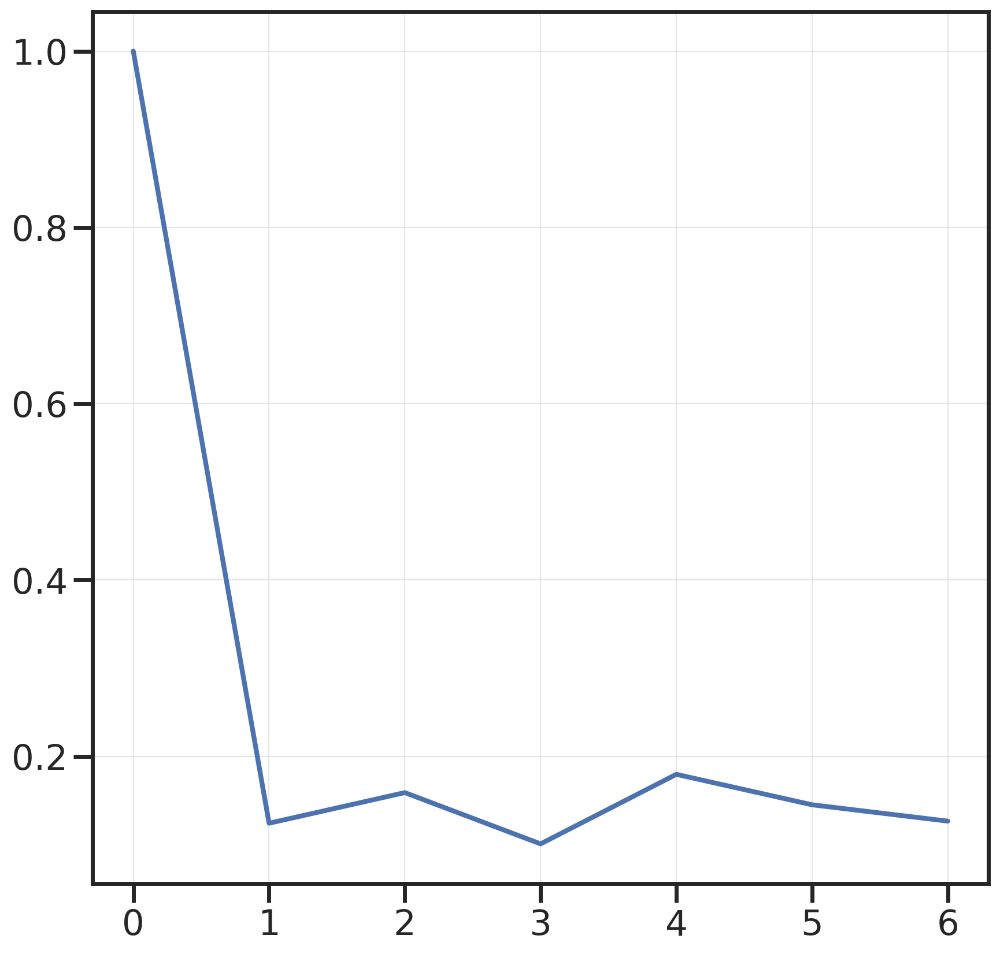

In [61]:
plt.plot(err)

#### Train Data

In [5]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_all.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_yh_all.p").reset_index(drop=True)

In [8]:
# idxs = []
for (config, ii) in didx.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = didx.iloc[ii]['t'].max()
    didx.loc[ii, 't'] /= tmax
#     if didx.iloc[ii[-1]]['err'] < 0.1:
#         idxs.extend(ii)
# didx = didx.iloc[idxs].reset_index(drop=True)
# r['xp'] = r['xp'][idxs, :]

In [34]:
r['xp'] = np.vstack([r['xp'], r['extra_points']])[:-1, :]

In [ ]:
emph = [list(didx[didx.m=='geodesic'].index)]
fig, text, dc = plotly_3d(dc=didx.reset_index(drop=True), r=r, emph=emph, empsize=8,
                          colorscale='Viridis', 
                          ne=5, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t',mode='markers', cmap=None, separate_traj=False, axis_range=[-1.5, 1.5])
fig.show()

/tmp/ipykernel_6289/27037418.py:71: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



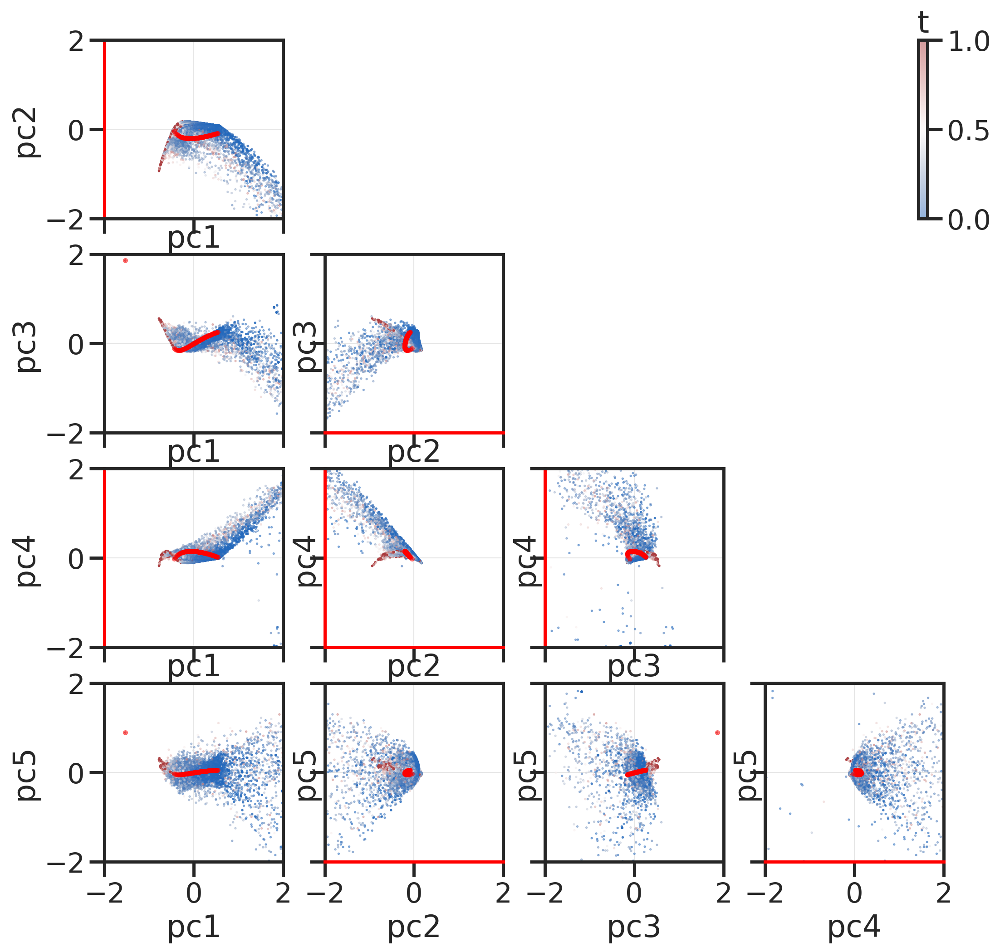

In [35]:
triplot(didx.reset_index(drop=True), r, emph=emph, d=5, cmap='vlag', cdict=None, ckey='t', 
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, xrange=[-2, 2], yrange=[-2, 2]
            )

#### Train with Geod (included in embedding)

In [5]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_all_geod.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all.p").reset_index(drop=True)

In [6]:
ii = np.argsort(r['es'])[::-1]
es = r['es'][ii]
vs = r['vs'][:, ii]
b = r['diag']
tr = r['tr']

df = []
for i in range(len(es)):
    tr = 2*(r['tr'] - es[:i].sum())**2
    bnorm = 2*len(vs)*((b - (es[:i]*(vs[:, :i]**2)).sum(1))**2).sum()
    Bf = 4*(r['fn']**2 - (es[:i]**2).sum())
    df.append(tr+bnorm+Bf)

In [7]:
r['xp'] = vs[:, :7] * np.sqrt(np.abs(es)[:7])

In [8]:
idxs = []
for (config, ii) in didx.groupby(['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = didx.iloc[ii]['t'].max()
    didx.loc[ii, 't'] /= tmax
    if didx.iloc[ii[-1]]['err'] < 0.1:
        idxs.extend(ii)
dd = didx.iloc[idxs].reset_index(drop=True)
r['xp'] = r['xp'][idxs, :]

In [9]:
p = r['xp'][-1, :]

In [10]:
u = np.linspace(0, 5, 240)
v = np.linspace(0, 2 * np.pi, 240)
uGrid, vGrid = np.meshgrid(u, v)

x = uGrid * np.cos(vGrid) + p[0]
y = uGrid + p[1]
z = uGrid * np.sin(vGrid) + p[2]

In [ ]:
emph = [list(dd[dd.m=='geodesic'].index)]
fig, text, dc = plotly_3d(dc=dd.reset_index(drop=True), r=r, emph=emph, empsize=4, colorscale='Viridis', 
                          ne=5, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t',mode='markers', cmap=None, separate_traj=False, axis_range=[-5, 5])
# fig.add_trace(go.Surface(x=x, y=y, z=z, opacity=0.5))
fig.show()

In [ ]:
emph = [list(didx[didx.m=='geodesic'].index)]
fig, text, dc = plotly_3d(dc=didx.reset_index(drop=True), r=r, emph=emph, empsize=4, colorscale='Viridis', 
                          ne=5, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t',mode='markers', cmap=None, separate_traj=False, axis_range=[-5, 5])
fig.add_trace(go.Surface(x=x, y=y, z=z, opacity=0.5))
fig.show()

In [ ]:
emph = [list(didx[didx.m=='geodesic'].index)]
didx['d2pstar'] = w[-1, :]
didx['d2p0'] = w[-99, :]
fig, text, dc = plotly_3d(dc=didx.reset_index(drop=True), r=r, emph=emph, empsize=4, colorscale='Viridis', 
                          ne=5, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='d2pstar',mode='markers', cmap=None, separate_traj=False, axis_range=[-5, 5])
fig.show()

In [ ]:
fig, text, dc = plotly_3d(dc=didx.reset_index(drop=True), r=r, emph=emph, empsize=4, colorscale='Viridis', 
                          ne=5, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='d2p0',mode='markers', cmap=None, separate_traj=False, axis_range=[-5, 5])
fig.show()

/tmp/ipykernel_7054/27037418.py:71: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



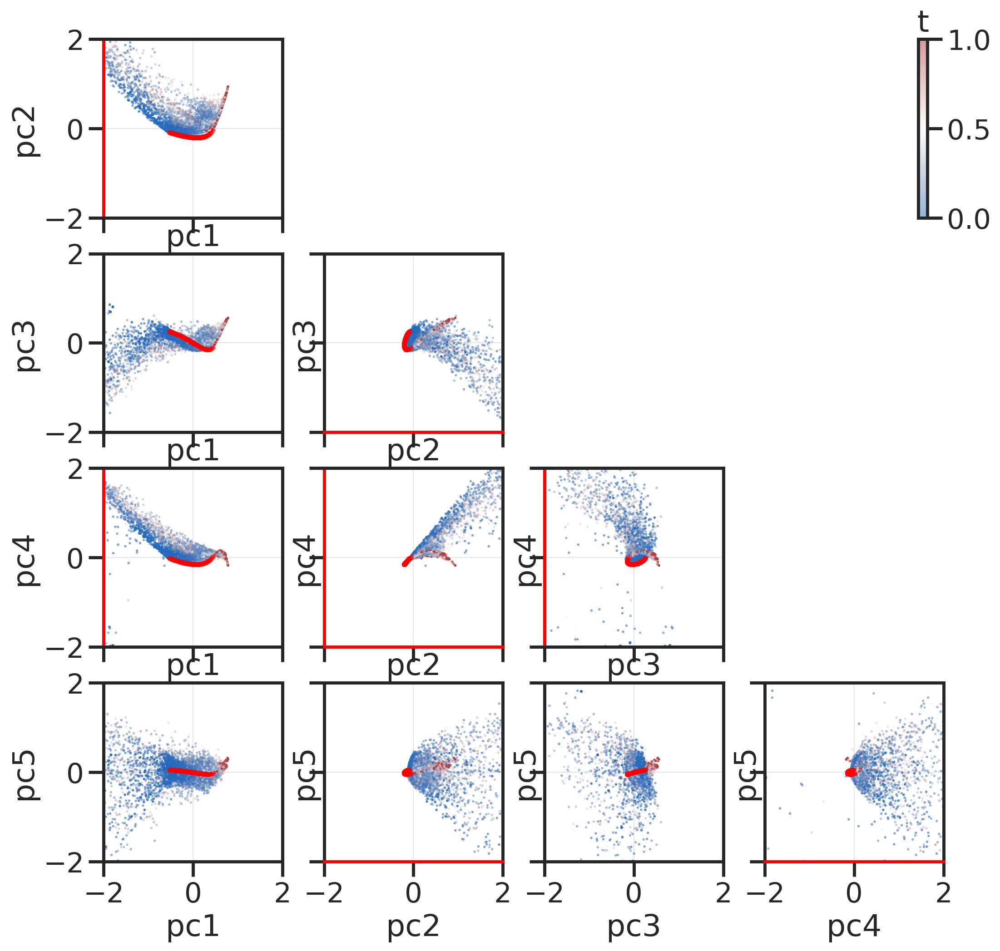

In [65]:
triplot(didx.reset_index(drop=True), r, emph=emph, d=5, cmap='vlag', cdict=None, ckey='t', 
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, xrange=[-2, 2], yrange=[-2, 2]
            )

#### Test with Geod (included in embedding)

In [38]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yvh_all_geod.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all.p").reset_index(drop=True)

In [91]:
p = r['xp'][-1, :]
u = np.linspace(-5, 5, 240)
v = np.linspace(0, 2 * np.pi, 240)
uGrid, vGrid = np.meshgrid(u, v)

x = uGrid * np.cos(vGrid) + p[0]
y = uGrid + p[1]
z = uGrid * np.sin(vGrid) + p[2]

surface = go.Surface(x=x, y=y, z=z, opacity=0.5)

In [ ]:
emph = [list(didx[didx.m=='geodesic'].index)]
fig, text, dc = plotly_3d(dc=dd.reset_index(drop=True), r=r_, emph=emph, empmode='markers', empsize=8,
                          colorscale='Viridis', 
                          ne=5, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t',mode='markers', cmap=None, separate_traj=False, axis_range=[-1.5, 1.5])
fig.add_trace(surface)
fig.show()

In [27]:
xx = r['xp']
dd = didx
for (config, ii) in didx.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = dd.iloc[ii]['t'].max()
    dd.loc[ii, 't'] /= tmax
    di = dd.iloc[ii]
    for t in di.t.unique():
        ti = get_idx(di, f"t=={t}")
        xx = np.vstack([xx, xx[ti, :].mean(0, keepdims=True)])
        dd = pd.concat([dd, pd.DataFrame([list(config) + [0, t]], 
                            columns=['m', 'opt', 'bs', 'aug', 'lr', 'wd', 'seed', 't'])])

In [ ]:
# emph = [list(np.arange(len(didx), len(dd)))]
emph = [list(didx[didx.m=='geodesic'].index)]
# r_ = r
# r_['xp'] = xx
fig, text, dc = plotly_3d(dc=dd.reset_index(drop=True), r=r_, emph=emph, empmode='markers', empsize=8,
                          colorscale='Viridis', 
                          ne=5, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t',mode='markers', cmap=None, separate_traj=False, axis_range=[-1.5, 1.5])
fig.show()

/tmp/ipykernel_6289/27037418.py:71: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



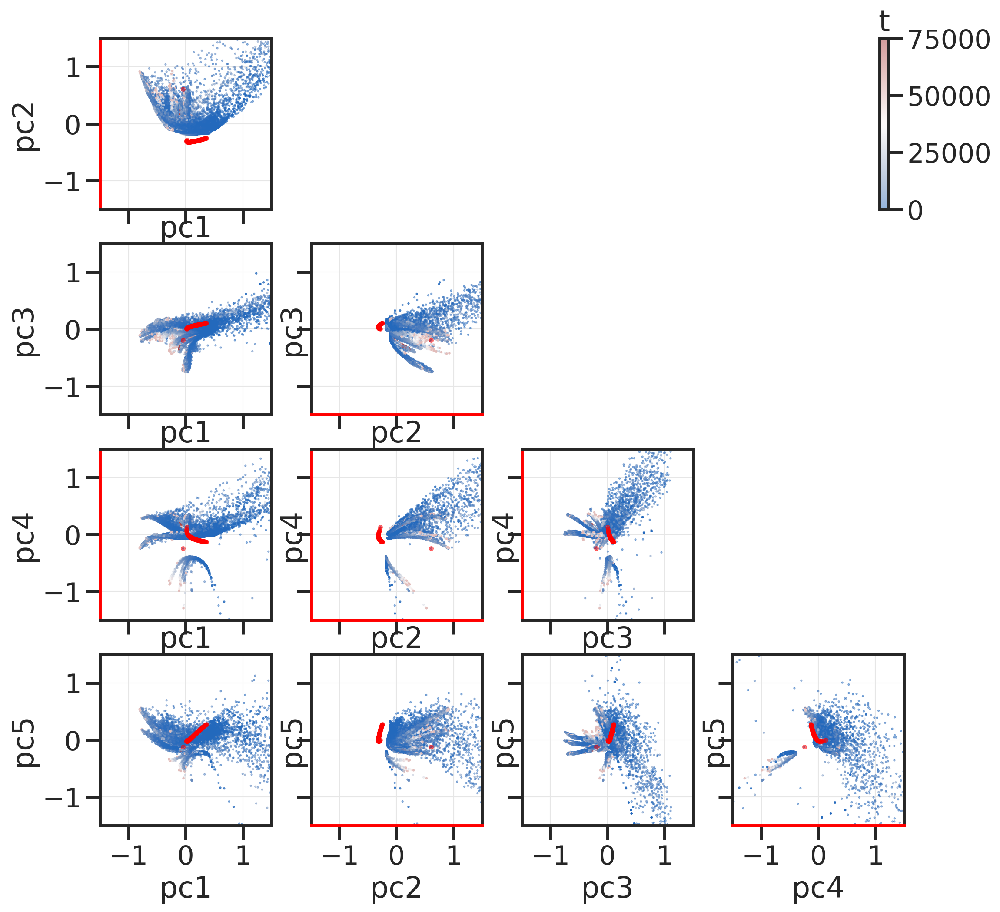

In [42]:
triplot(didx.reset_index(drop=True), r, emph=emph, d=5, cmap='vlag', cdict=None, ckey='t', 
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, xrange=[-1.5, 1.5], yrange=[-1.5, 1.5]
            )

#### Val Data

In [36]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yvh_all.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_yvh_all.p").reset_index(drop=False)

In [37]:
idxs = []
for (config, ii) in didx.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = didx.iloc[ii]['t'].max()
    didx.loc[ii, 't'] /= tmax
#     if didx.iloc[ii[-1]]['err'] < 0.1 and (didx.iloc[ii]['opt'] != 'adam').all():
#         idxs.extend(ii)
# didx = didx.iloc[idxs]
# r['xp'] = r['xp'][idxs, :]

In [135]:
xx = r['xp']
dd = didx
emph = []
for (config, ii) in didx.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = dd.iloc[ii]['t'].max()
    dd.loc[ii, 't'] /= tmax
    di = dd.iloc[ii]
    emph.append(list(range(len(xx), len(xx)+len(di.t.unique()))))
    for t in di.t.unique():
        ti = get_idx(di, f"t=={t}")
        xx = np.vstack([xx, xx[ti, :].mean(0, keepdims=True)])
        dd = pd.concat([dd, pd.DataFrame([list(config) + [0, t]], 
                            columns=['m', 'opt', 'bs', 'aug', 'lr', 'wd', 'seed', 't'])])


In [ ]:
r_ = r
r_['xp'] = xx
fig, text, dc = plotly_3d(dc=dd.reset_index(drop=True), r=r_, emph=emph, empmode='lines', empsize=8,
                          colorscale='Viridis', 
                          ne=5, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t',mode='markers', cmap=None, separate_traj=False, axis_range=[-1.5, 1.5])
fig.show()

In [ ]:
triplot(dd.reset_index(drop=True), r=r_, d=5, cmap='viridis', cdict=None, ckey='t',
            markers=["o", "x", "s", "*", "+", ".", ],
            evals=False, plot_avg=False
            )

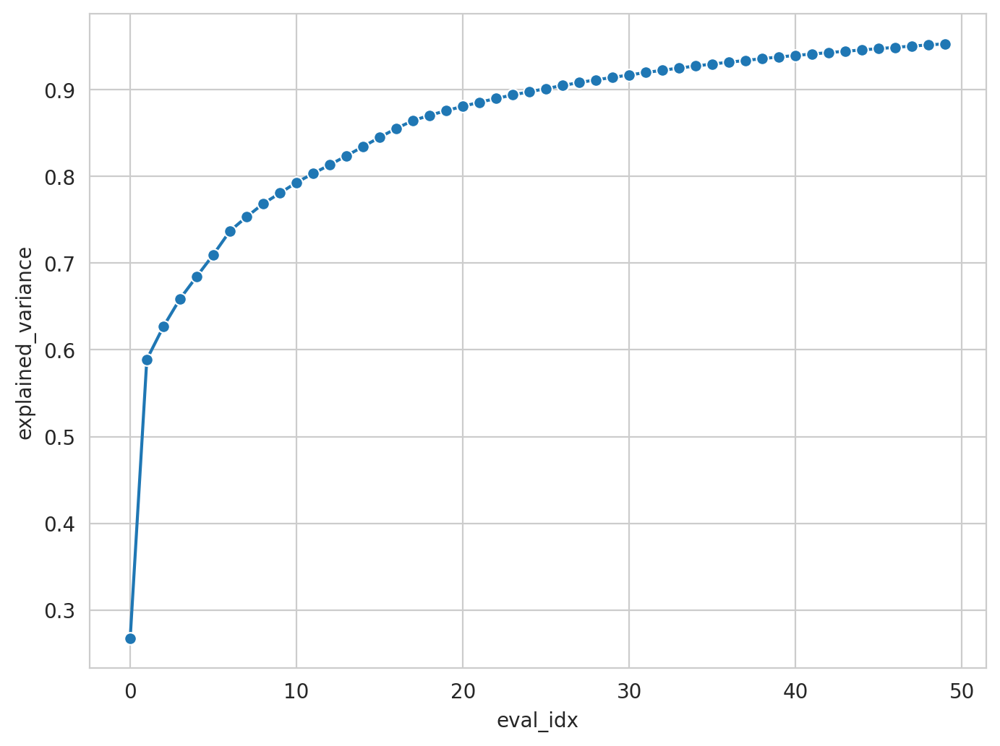

In [144]:
es = r['es'][-50::]
es =es[::-1]
df = pd.DataFrame(dict(eval_idx=np.arange(len(es)), explained_variance=1 - np.sqrt(1-np.cumsum(es ** 2)/r['fn']**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='explained_variance', marker="o")

### MDS

In [22]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_all_geod.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all.p").reset_index(drop=True)

In [23]:
idxs = get_idx(didx, "(m=='allcnn' or m=='geodesic') and aug == 'simple' and wd==0.0")
didx = didx.iloc[idxs].reset_index(drop=True)
r['xp'] = r['xp'][idxs]

In [18]:
from sklearn.manifold import MDS
mds = MDS(n_components=3, metric=True, dissimilarity='precomputed')

In [18]:
import h5py
f = h5py.File(f'/home/ubuntu/ext_vol/inpca/inpca_results_all/w_yh_all.h5', 'r')
w = f['w']

In [29]:
X_transformed = mds.fit_transform(w[idxs,:][:, idxs])
th.save(X_transformed, "mds_allcnn.p")

In [5]:
X_transformed = th.load('mds_allcnn.p')

In [8]:
r['xp'] = X_transformed

In [13]:
fig, text, dc = plotly_3d(dc=didx, r=r, colorscale='Viridis', 
                          ne=3, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t',mode='markers', cmap=None, separate_traj=False)
fig.show()

[ 19274.871  -12878.365    3048.754   -2666.2412   1997.1549   1829.8102
   1595.5645]


In [24]:
wi = w[idxs,:][:, idxs]
l = np.eye(wi.shape[0]) - 1.0/wi.shape[0]
wi = -l @ wi @ l / 2

In [25]:
from embed import proj_
r = proj_(wi, wi.shape[0], 3)

Projecting


In [26]:
fig, text, dc = plotly_3d(dc=didx, r=r, colorscale='Viridis', 
                          ne=3, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t',mode='markers', cmap=None, separate_traj=False)
fig.show()

[ 6.38708062e+02  5.10186795e+01  1.74538117e+01  1.12920817e+01
 -5.87193719e+00 -8.53273244e-01 -3.64086807e-01 -2.48660490e-01
 -1.93516119e-01]
